# DCGAN on CIFAR-10 — 100 Epochs, Best Checkpoint, and Visualisations

This notebook:

1. loads **CIFAR-10**
2. trains a **DCGAN** for **100 epochs**
3. saves:
   - `netG_best.pth`
   - `netG_latest.pth`
   - `netD_latest.pth`
4. saves **visualisations** during and after training
5. loads the **best generator**
6. generates final sample images

## Where everything is saved

This notebook uses:

```python
BASE_DIR = Path.cwd().resolve()
OUT_DIR = BASE_DIR / "outputs" / "dcgan_cifar10"
```

So all training outputs are saved in:

```python
outputs/dcgan_cifar10
```

relative to the folder where you **run the notebook**.

Typical saved files:
- `outputs/dcgan_cifar10/netG_best.pth`
- `outputs/dcgan_cifar10/netG_latest.pth`
- `outputs/dcgan_cifar10/netD_latest.pth`
- `outputs/dcgan_cifar10/samples/epoch_001.png`
- `outputs/dcgan_cifar10/samples/epoch_010.png`
- ...
- `outputs/dcgan_cifar10/loss_curves.png`
- `outputs/dcgan_cifar10/discriminator_scores.png`
- `outputs/dcgan_cifar10/real_vs_fake_comparison.png`
- `outputs/dcgan_cifar10/final_loaded_best_samples.png`

## Important
To stay compatible with:

```bash
py Scripts/test_dcgan.py --netG outputs/dcgan_cifar10/netG_best.pth ...
```

the notebook saves the generator as a **raw `state_dict`**:

```python
torch.save(netG.state_dict(), BEST_NETG_PATH)
```

## Best-model rule used here
The notebook saves the **best generator** using the **lowest average generator loss per epoch**.


In [1]:
from pathlib import Path
import math
import random
import json

import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms, utils
from tqdm.auto import tqdm

In [2]:
# Reproducibility
SEED = 42

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

Device: cuda


In [3]:
# Configuration
BASE_DIR = Path.cwd().resolve()
DATA_ROOT = BASE_DIR / "data"
OUT_DIR = BASE_DIR / "outputs" / "dcgan_cifar10"
SAMPLES_DIR = OUT_DIR / "samples"

IMAGE_SIZE = 32
NC = 3
NZ = 100
NGF = 64
NDF = 64

BATCH_SIZE = 128
NUM_EPOCHS = 100
LR = 2e-4
BETA1 = 0.5
BETA2 = 0.999

NUM_WORKERS = 0
SAVE_SAMPLE_EVERY = 10

OUT_DIR.mkdir(parents=True, exist_ok=True)
SAMPLES_DIR.mkdir(parents=True, exist_ok=True)

BEST_NETG_PATH = OUT_DIR / "netG_best.pth"
LATEST_NETG_PATH = OUT_DIR / "netG_latest.pth"
LATEST_NETD_PATH = OUT_DIR / "netD_latest.pth"
LOSS_PLOT_PATH = OUT_DIR / "loss_curves.png"
DISC_SCORE_PLOT_PATH = OUT_DIR / "discriminator_scores.png"
REAL_FAKE_COMPARISON_PATH = OUT_DIR / "real_vs_fake_comparison.png"
FINAL_BEST_SAMPLES_PATH = OUT_DIR / "final_loaded_best_samples.png"
HISTORY_PATH = OUT_DIR / "training_history.json"

print("BASE_DIR:", BASE_DIR)
print("DATA_ROOT:", DATA_ROOT)
print("OUT_DIR:", OUT_DIR)

BASE_DIR: C:\Users\aggel\Downloads
DATA_ROOT: C:\Users\aggel\Downloads\data
OUT_DIR: C:\Users\aggel\Downloads\outputs\dcgan_cifar10


## Load CIFAR-10

Images are normalized to **[-1, 1]** because the generator ends with **Tanh()**.


In [4]:
transform = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])

train_dataset = datasets.CIFAR10(
    root=str(DATA_ROOT),
    train=True,
    download=True,
    transform=transform,
)

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=torch.cuda.is_available(),
)

print("Train samples:", len(train_dataset))
print("Batches per epoch:", len(train_loader))

100%|██████████| 170M/170M [00:13<00:00, 13.0MB/s] 


Extracting C:\Users\aggel\Downloads\data\cifar-10-python.tar.gz to C:\Users\aggel\Downloads\data
Train samples: 50000
Batches per epoch: 391


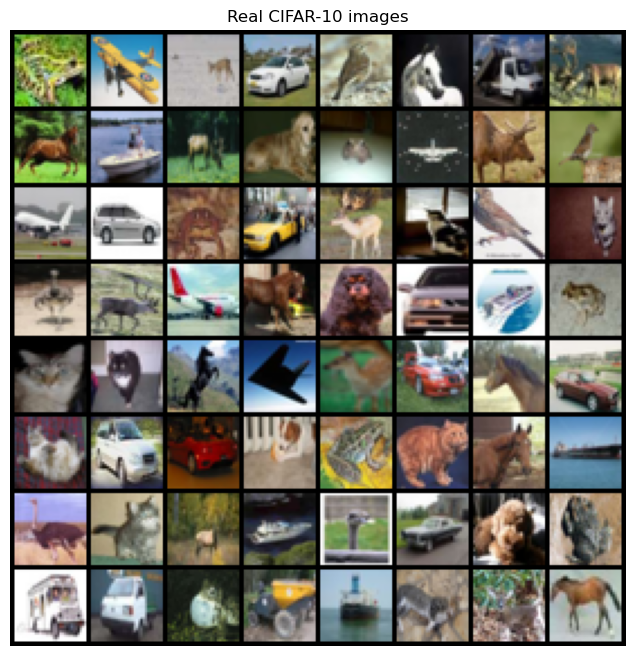

In [5]:
# Show some real images
real_batch, _ = next(iter(train_loader))

def denorm(x):
    return (x + 1) / 2

grid = utils.make_grid(denorm(real_batch[:64]), nrow=8, padding=2)

plt.figure(figsize=(8, 8))
plt.axis("off")
plt.title("Real CIFAR-10 images")
plt.imshow(grid.permute(1, 2, 0).cpu().numpy())
plt.show()

## DCGAN model

In [6]:
def _validate_image_size(image_size):
    if image_size < 32 or (image_size & (image_size - 1)) != 0:
        raise ValueError("image_size must be a power of 2 and >= 32.")


class DCGANGenerator(nn.Module):
    def __init__(self, ngpu: int = 1, nc: int = 3, nz: int = 100, ngf: int = 64, image_size: int = 32):
        super().__init__()
        _validate_image_size(image_size)
        self.ngpu = ngpu
        self.nz = nz
        self.image_size = image_size

        layers = [
            nn.ConvTranspose2d(nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
        ]

        current_channels = ngf * 8
        upsample_blocks = int(math.log2(image_size)) - 2
        for _ in range(upsample_blocks):
            next_channels = max(ngf, current_channels // 2)
            layers.extend([
                nn.ConvTranspose2d(current_channels, next_channels, 4, 2, 1, bias=False),
                nn.BatchNorm2d(next_channels),
                nn.ReLU(True),
            ])
            current_channels = next_channels

        layers.extend([
            nn.Conv2d(current_channels, nc, kernel_size=3, stride=1, padding=1, bias=False),
            nn.Tanh(),
        ])
        self.main = nn.Sequential(*layers)

    def forward(self, z: torch.Tensor):
        return self.main(z)


class DCGANDiscriminator(nn.Module):
    def __init__(self, ngpu: int = 1, nc: int = 3, ndf: int = 64, image_size: int = 32):
        super().__init__()
        _validate_image_size(image_size)
        self.ngpu = ngpu

        layers = [
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
        ]

        current_channels = ndf
        current_size = image_size // 2
        while current_size > 4:
            next_channels = min(current_channels * 2, ndf * 8)
            layers.extend([
                nn.Conv2d(current_channels, next_channels, 4, 2, 1, bias=False),
                nn.BatchNorm2d(next_channels),
                nn.LeakyReLU(0.2, inplace=True),
            ])
            current_channels = next_channels
            current_size //= 2

        layers.extend([
            nn.Conv2d(current_channels, 1, 4, 1, 0, bias=False),
            nn.Sigmoid(),
        ])
        self.main = nn.Sequential(*layers)

    def forward(self, x):
        logits = self.main(x)
        return logits.view(-1, 1).squeeze(1)


def dcgan_weights_init(module):
    class_name = module.__class__.__name__
    if "Conv" in class_name and hasattr(module, "weight") and module.weight is not None:
        nn.init.normal_(module.weight.data, 0.0, 0.02)
    elif "BatchNorm" in class_name:
        if hasattr(module, "weight") and module.weight is not None:
            nn.init.normal_(module.weight.data, 1.0, 0.02)
        if hasattr(module, "bias") and module.bias is not None:
            nn.init.constant_(module.bias.data, 0)

In [7]:
netG = DCGANGenerator(nc=NC, nz=NZ, ngf=NGF, image_size=IMAGE_SIZE).to(device)
netD = DCGANDiscriminator(nc=NC, ndf=NDF, image_size=IMAGE_SIZE).to(device)

netG.apply(dcgan_weights_init)
netD.apply(dcgan_weights_init)

print(netG)
print()
print(netD)

DCGANGenerator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

DCG

## Training setup

In [8]:
criterion = nn.BCELoss()

optimizerD = optim.Adam(netD.parameters(), lr=LR, betas=(BETA1, BETA2))
optimizerG = optim.Adam(netG.parameters(), lr=LR, betas=(BETA1, BETA2))

fixed_noise = torch.randn(64, NZ, 1, 1, device=device)

real_label = 1.0
fake_label = 0.0

history = {
    "g_loss": [],
    "d_loss": [],
    "D_x": [],
    "D_G_z1": [],
    "D_G_z2": [],
}

best_g_loss = float("inf")
best_epoch = -1

In [9]:
@torch.no_grad()
def save_fake_grid(generator, noise, save_path, title=None):
    generator.eval()
    fake = generator(noise).detach().cpu()
    grid = utils.make_grid((fake + 1) / 2, nrow=8, padding=2)

    plt.figure(figsize=(8, 8))
    plt.axis("off")
    if title is not None:
        plt.title(title)
    plt.imshow(grid.permute(1, 2, 0).numpy())
    plt.tight_layout()
    plt.savefig(save_path, bbox_inches="tight")
    plt.show()

    generator.train()


@torch.no_grad()
def save_real_vs_fake_comparison(real_images, generator, noise, save_path):
    generator.eval()
    fake_images = generator(noise).detach().cpu()

    real_grid = utils.make_grid((real_images[:64].cpu() + 1) / 2, nrow=8, padding=2)
    fake_grid = utils.make_grid((fake_images[:64] + 1) / 2, nrow=8, padding=2)

    fig, axes = plt.subplots(1, 2, figsize=(16, 8))
    axes[0].imshow(real_grid.permute(1, 2, 0).numpy())
    axes[0].set_title("Real CIFAR-10")
    axes[0].axis("off")

    axes[1].imshow(fake_grid.permute(1, 2, 0).numpy())
    axes[1].set_title("Fake CIFAR-10")
    axes[1].axis("off")

    plt.tight_layout()
    plt.savefig(save_path, bbox_inches="tight")
    plt.show()
    generator.train()

## Train for 100 epochs and save the best generator

Saved files:
- `netG_best.pth`
- `netG_latest.pth`
- `netD_latest.pth`
- sample grids every 10 epochs
- loss plots
- discriminator score plots
- real-vs-fake comparison
- training history JSON


Epoch 1/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [1/100]  avg D loss: 0.6886  avg G loss: 3.8730  avg D(x): 0.7457  avg D(G(z)) before G: 0.2414  avg D(G(z)) after G: 0.0440
Saved new best generator to: C:\Users\aggel\Downloads\outputs\dcgan_cifar10\netG_best.pth


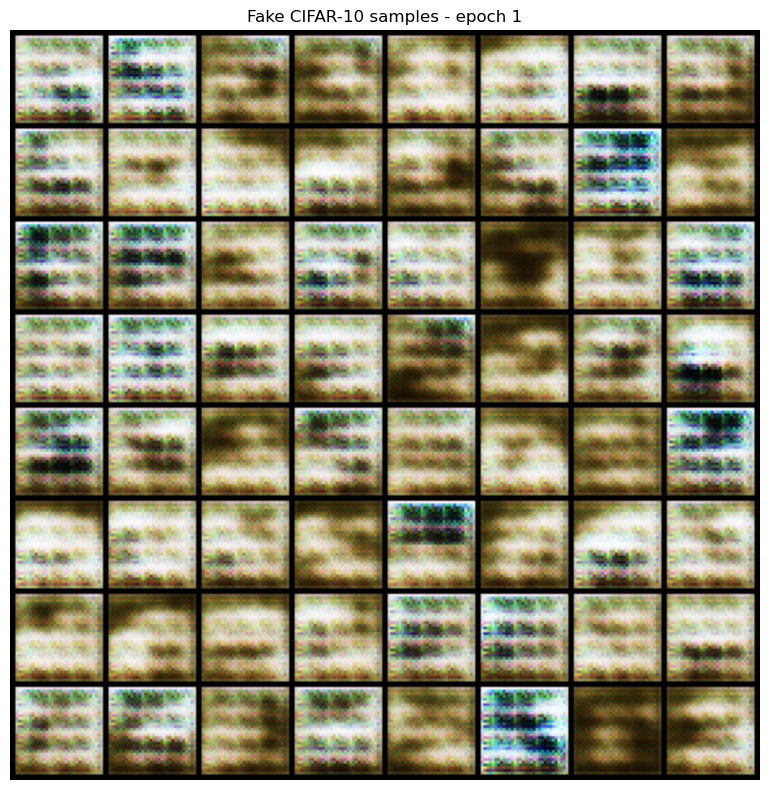

Epoch 2/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [2/100]  avg D loss: 0.7990  avg G loss: 2.7038  avg D(x): 0.7052  avg D(G(z)) before G: 0.2851  avg D(G(z)) after G: 0.0991
Saved new best generator to: C:\Users\aggel\Downloads\outputs\dcgan_cifar10\netG_best.pth


Epoch 3/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [3/100]  avg D loss: 0.7192  avg G loss: 2.8357  avg D(x): 0.7355  avg D(G(z)) before G: 0.2588  avg D(G(z)) after G: 0.0930


Epoch 4/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [4/100]  avg D loss: 0.7983  avg G loss: 2.4904  avg D(x): 0.7085  avg D(G(z)) before G: 0.2853  avg D(G(z)) after G: 0.1216
Saved new best generator to: C:\Users\aggel\Downloads\outputs\dcgan_cifar10\netG_best.pth


Epoch 5/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [5/100]  avg D loss: 0.8546  avg G loss: 2.4621  avg D(x): 0.6970  avg D(G(z)) before G: 0.2987  avg D(G(z)) after G: 0.1375
Saved new best generator to: C:\Users\aggel\Downloads\outputs\dcgan_cifar10\netG_best.pth


Epoch 6/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [6/100]  avg D loss: 0.9133  avg G loss: 2.0743  avg D(x): 0.6736  avg D(G(z)) before G: 0.3243  avg D(G(z)) after G: 0.1719
Saved new best generator to: C:\Users\aggel\Downloads\outputs\dcgan_cifar10\netG_best.pth


Epoch 7/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [7/100]  avg D loss: 1.0174  avg G loss: 1.8927  avg D(x): 0.6465  avg D(G(z)) before G: 0.3513  avg D(G(z)) after G: 0.2048
Saved new best generator to: C:\Users\aggel\Downloads\outputs\dcgan_cifar10\netG_best.pth


Epoch 8/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [8/100]  avg D loss: 1.0590  avg G loss: 1.6895  avg D(x): 0.6244  avg D(G(z)) before G: 0.3737  avg D(G(z)) after G: 0.2264
Saved new best generator to: C:\Users\aggel\Downloads\outputs\dcgan_cifar10\netG_best.pth


Epoch 9/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [9/100]  avg D loss: 1.1073  avg G loss: 1.5757  avg D(x): 0.6113  avg D(G(z)) before G: 0.3869  avg D(G(z)) after G: 0.2508
Saved new best generator to: C:\Users\aggel\Downloads\outputs\dcgan_cifar10\netG_best.pth


Epoch 10/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [10/100]  avg D loss: 1.0926  avg G loss: 1.5803  avg D(x): 0.6140  avg D(G(z)) before G: 0.3840  avg D(G(z)) after G: 0.2522


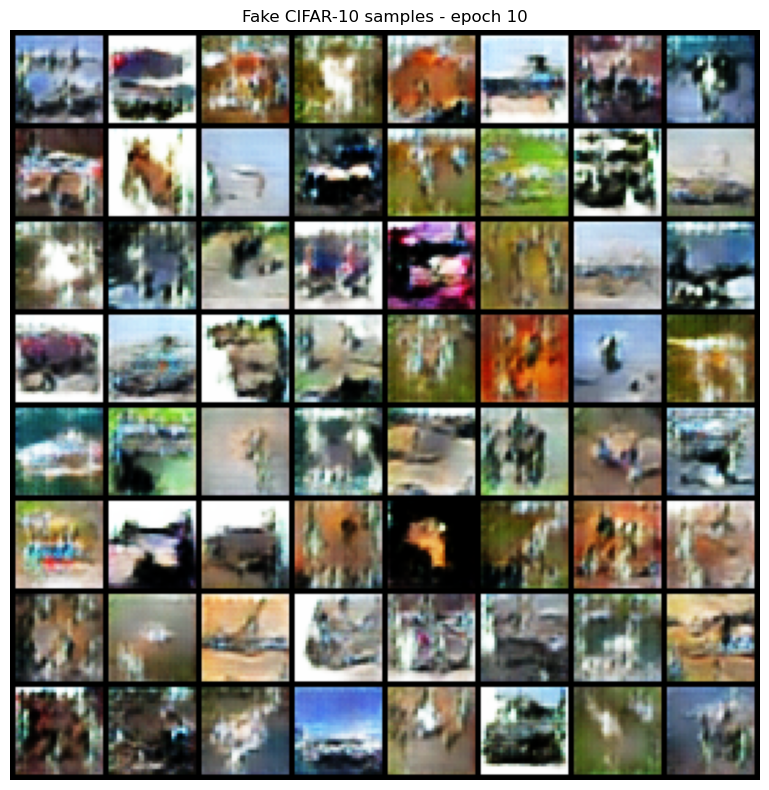

Epoch 11/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [11/100]  avg D loss: 1.0874  avg G loss: 1.4968  avg D(x): 0.6139  avg D(G(z)) before G: 0.3849  avg D(G(z)) after G: 0.2671
Saved new best generator to: C:\Users\aggel\Downloads\outputs\dcgan_cifar10\netG_best.pth


Epoch 12/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [12/100]  avg D loss: 1.1009  avg G loss: 1.4637  avg D(x): 0.6107  avg D(G(z)) before G: 0.3872  avg D(G(z)) after G: 0.2764
Saved new best generator to: C:\Users\aggel\Downloads\outputs\dcgan_cifar10\netG_best.pth


Epoch 13/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [13/100]  avg D loss: 1.1196  avg G loss: 1.4279  avg D(x): 0.6032  avg D(G(z)) before G: 0.3957  avg D(G(z)) after G: 0.2813
Saved new best generator to: C:\Users\aggel\Downloads\outputs\dcgan_cifar10\netG_best.pth


Epoch 14/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [14/100]  avg D loss: 1.1502  avg G loss: 1.3603  avg D(x): 0.5936  avg D(G(z)) before G: 0.4053  avg D(G(z)) after G: 0.2953
Saved new best generator to: C:\Users\aggel\Downloads\outputs\dcgan_cifar10\netG_best.pth


Epoch 15/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [15/100]  avg D loss: 1.1363  avg G loss: 1.3286  avg D(x): 0.5956  avg D(G(z)) before G: 0.4031  avg D(G(z)) after G: 0.3019
Saved new best generator to: C:\Users\aggel\Downloads\outputs\dcgan_cifar10\netG_best.pth


Epoch 16/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [16/100]  avg D loss: 1.1681  avg G loss: 1.3278  avg D(x): 0.5887  avg D(G(z)) before G: 0.4107  avg D(G(z)) after G: 0.3033
Saved new best generator to: C:\Users\aggel\Downloads\outputs\dcgan_cifar10\netG_best.pth


Epoch 17/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [17/100]  avg D loss: 1.1682  avg G loss: 1.2775  avg D(x): 0.5858  avg D(G(z)) before G: 0.4133  avg D(G(z)) after G: 0.3148
Saved new best generator to: C:\Users\aggel\Downloads\outputs\dcgan_cifar10\netG_best.pth


Epoch 18/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [18/100]  avg D loss: 1.1819  avg G loss: 1.2791  avg D(x): 0.5843  avg D(G(z)) before G: 0.4153  avg D(G(z)) after G: 0.3161


Epoch 19/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [19/100]  avg D loss: 1.1913  avg G loss: 1.2541  avg D(x): 0.5800  avg D(G(z)) before G: 0.4188  avg D(G(z)) after G: 0.3212
Saved new best generator to: C:\Users\aggel\Downloads\outputs\dcgan_cifar10\netG_best.pth


Epoch 20/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [20/100]  avg D loss: 1.1968  avg G loss: 1.2445  avg D(x): 0.5785  avg D(G(z)) before G: 0.4212  avg D(G(z)) after G: 0.3229
Saved new best generator to: C:\Users\aggel\Downloads\outputs\dcgan_cifar10\netG_best.pth


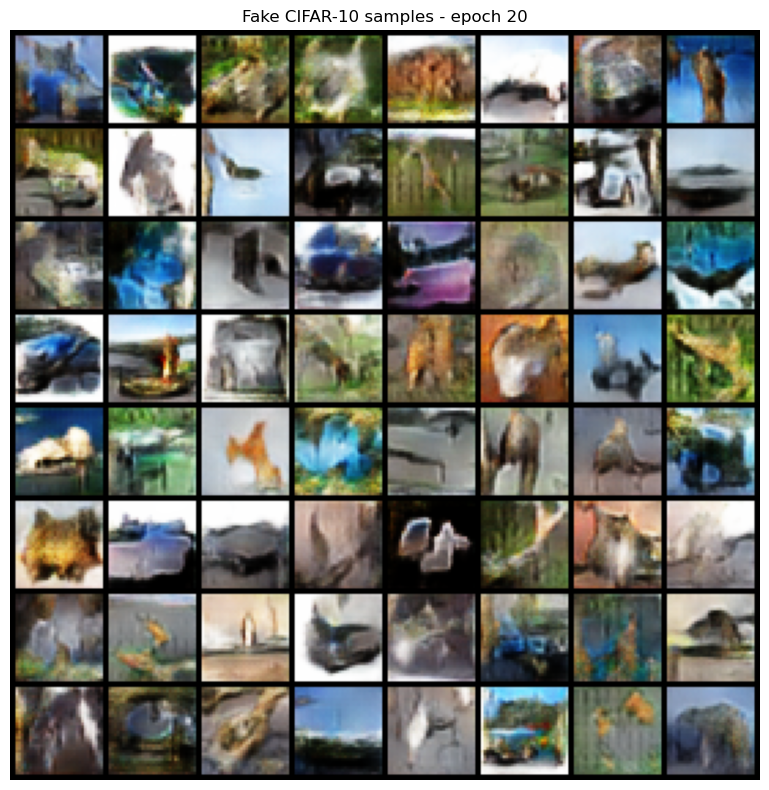

Epoch 21/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [21/100]  avg D loss: 1.1957  avg G loss: 1.2360  avg D(x): 0.5775  avg D(G(z)) before G: 0.4216  avg D(G(z)) after G: 0.3252
Saved new best generator to: C:\Users\aggel\Downloads\outputs\dcgan_cifar10\netG_best.pth


Epoch 22/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [22/100]  avg D loss: 1.2017  avg G loss: 1.2238  avg D(x): 0.5771  avg D(G(z)) before G: 0.4224  avg D(G(z)) after G: 0.3295
Saved new best generator to: C:\Users\aggel\Downloads\outputs\dcgan_cifar10\netG_best.pth


Epoch 23/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [23/100]  avg D loss: 1.1996  avg G loss: 1.2249  avg D(x): 0.5767  avg D(G(z)) before G: 0.4228  avg D(G(z)) after G: 0.3279


Epoch 24/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [24/100]  avg D loss: 1.2038  avg G loss: 1.2046  avg D(x): 0.5770  avg D(G(z)) before G: 0.4226  avg D(G(z)) after G: 0.3359
Saved new best generator to: C:\Users\aggel\Downloads\outputs\dcgan_cifar10\netG_best.pth


Epoch 25/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [25/100]  avg D loss: 1.1991  avg G loss: 1.2189  avg D(x): 0.5758  avg D(G(z)) before G: 0.4235  avg D(G(z)) after G: 0.3289


Epoch 26/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [26/100]  avg D loss: 1.2030  avg G loss: 1.1927  avg D(x): 0.5751  avg D(G(z)) before G: 0.4240  avg D(G(z)) after G: 0.3368
Saved new best generator to: C:\Users\aggel\Downloads\outputs\dcgan_cifar10\netG_best.pth


Epoch 27/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [27/100]  avg D loss: 1.1898  avg G loss: 1.2264  avg D(x): 0.5797  avg D(G(z)) before G: 0.4202  avg D(G(z)) after G: 0.3283


Epoch 28/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [28/100]  avg D loss: 1.1842  avg G loss: 1.2146  avg D(x): 0.5803  avg D(G(z)) before G: 0.4189  avg D(G(z)) after G: 0.3306


Epoch 29/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [29/100]  avg D loss: 1.1911  avg G loss: 1.2324  avg D(x): 0.5805  avg D(G(z)) before G: 0.4185  avg D(G(z)) after G: 0.3280


Epoch 30/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [30/100]  avg D loss: 1.1784  avg G loss: 1.2280  avg D(x): 0.5829  avg D(G(z)) before G: 0.4166  avg D(G(z)) after G: 0.3277


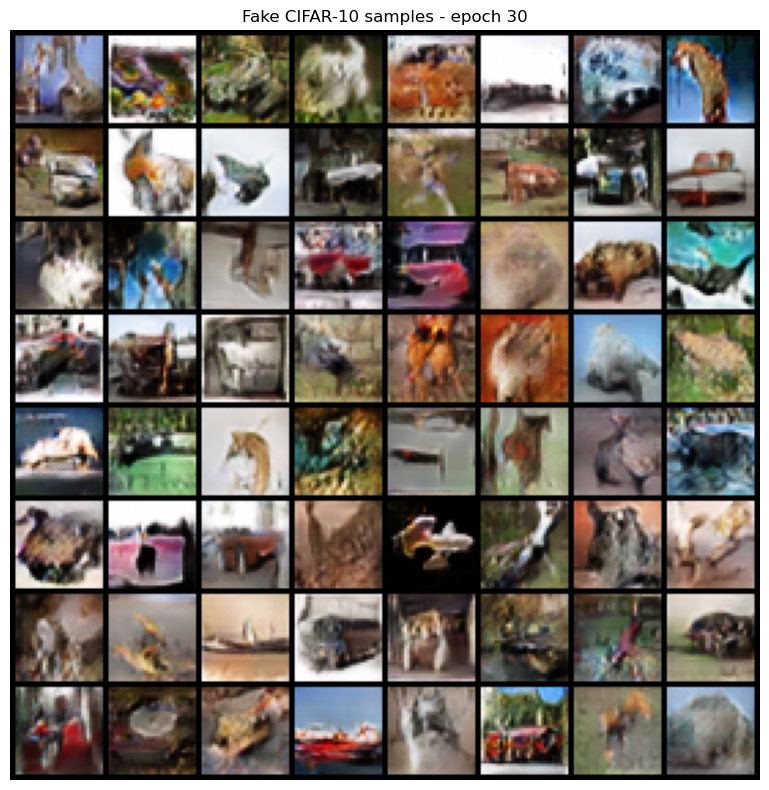

Epoch 31/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [31/100]  avg D loss: 1.1780  avg G loss: 1.2495  avg D(x): 0.5847  avg D(G(z)) before G: 0.4151  avg D(G(z)) after G: 0.3233


Epoch 32/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [32/100]  avg D loss: 1.1648  avg G loss: 1.2449  avg D(x): 0.5860  avg D(G(z)) before G: 0.4133  avg D(G(z)) after G: 0.3223


Epoch 33/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [33/100]  avg D loss: 1.1813  avg G loss: 1.2428  avg D(x): 0.5850  avg D(G(z)) before G: 0.4147  avg D(G(z)) after G: 0.3256


Epoch 34/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [34/100]  avg D loss: 1.1662  avg G loss: 1.2571  avg D(x): 0.5884  avg D(G(z)) before G: 0.4108  avg D(G(z)) after G: 0.3227


Epoch 35/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [35/100]  avg D loss: 1.1485  avg G loss: 1.2664  avg D(x): 0.5915  avg D(G(z)) before G: 0.4082  avg D(G(z)) after G: 0.3178


Epoch 36/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [36/100]  avg D loss: 1.1376  avg G loss: 1.2844  avg D(x): 0.5944  avg D(G(z)) before G: 0.4049  avg D(G(z)) after G: 0.3129


Epoch 37/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [37/100]  avg D loss: 1.1494  avg G loss: 1.2892  avg D(x): 0.5935  avg D(G(z)) before G: 0.4060  avg D(G(z)) after G: 0.3151


Epoch 38/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [38/100]  avg D loss: 1.1322  avg G loss: 1.2868  avg D(x): 0.5970  avg D(G(z)) before G: 0.4018  avg D(G(z)) after G: 0.3136


Epoch 39/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [39/100]  avg D loss: 1.1224  avg G loss: 1.3025  avg D(x): 0.6004  avg D(G(z)) before G: 0.3994  avg D(G(z)) after G: 0.3103


Epoch 40/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [40/100]  avg D loss: 1.1226  avg G loss: 1.3163  avg D(x): 0.6015  avg D(G(z)) before G: 0.3977  avg D(G(z)) after G: 0.3081


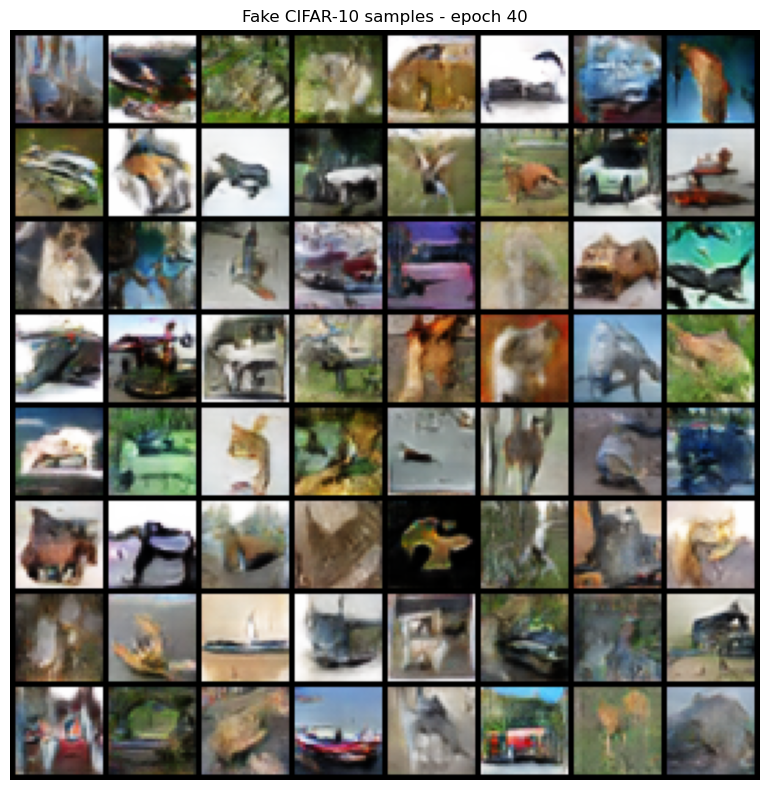

Epoch 41/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [41/100]  avg D loss: 1.1005  avg G loss: 1.3393  avg D(x): 0.6067  avg D(G(z)) before G: 0.3927  avg D(G(z)) after G: 0.3015


Epoch 42/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [42/100]  avg D loss: 1.1061  avg G loss: 1.3379  avg D(x): 0.6077  avg D(G(z)) before G: 0.3915  avg D(G(z)) after G: 0.3039


Epoch 43/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [43/100]  avg D loss: 1.0837  avg G loss: 1.3424  avg D(x): 0.6113  avg D(G(z)) before G: 0.3885  avg D(G(z)) after G: 0.3003


Epoch 44/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [44/100]  avg D loss: 1.0819  avg G loss: 1.3794  avg D(x): 0.6141  avg D(G(z)) before G: 0.3848  avg D(G(z)) after G: 0.2947


Epoch 45/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [45/100]  avg D loss: 1.0784  avg G loss: 1.3791  avg D(x): 0.6160  avg D(G(z)) before G: 0.3835  avg D(G(z)) after G: 0.2953


Epoch 46/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [46/100]  avg D loss: 1.0698  avg G loss: 1.4077  avg D(x): 0.6178  avg D(G(z)) before G: 0.3811  avg D(G(z)) after G: 0.2885


Epoch 47/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [47/100]  avg D loss: 1.0398  avg G loss: 1.4009  avg D(x): 0.6249  avg D(G(z)) before G: 0.3745  avg D(G(z)) after G: 0.2872


Epoch 48/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [48/100]  avg D loss: 1.0526  avg G loss: 1.4253  avg D(x): 0.6248  avg D(G(z)) before G: 0.3746  avg D(G(z)) after G: 0.2869


Epoch 49/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [49/100]  avg D loss: 1.0277  avg G loss: 1.4423  avg D(x): 0.6298  avg D(G(z)) before G: 0.3691  avg D(G(z)) after G: 0.2796


Epoch 50/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [50/100]  avg D loss: 1.0512  avg G loss: 1.4570  avg D(x): 0.6281  avg D(G(z)) before G: 0.3716  avg D(G(z)) after G: 0.2824


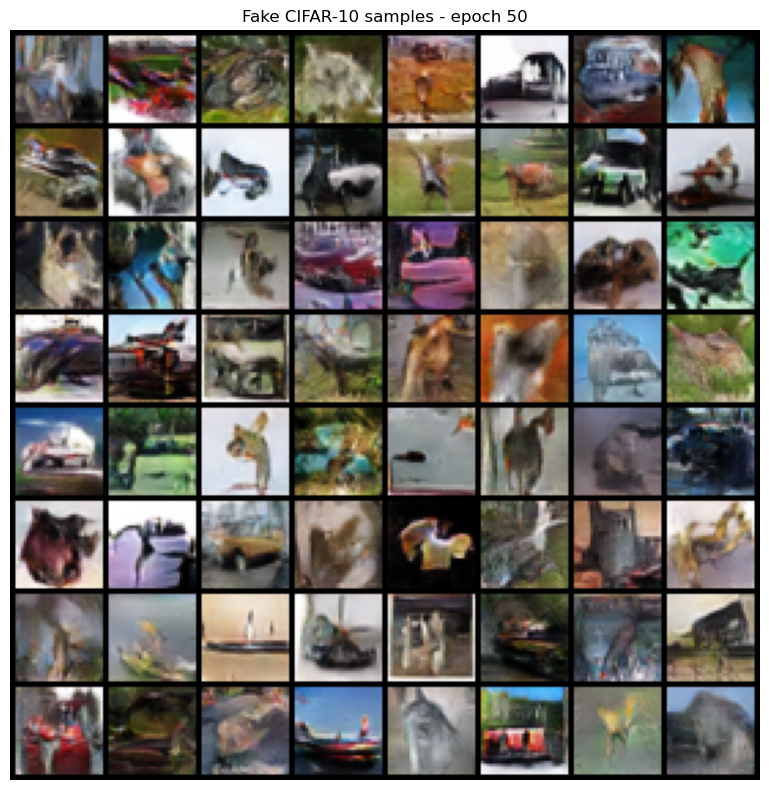

Epoch 51/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [51/100]  avg D loss: 0.9993  avg G loss: 1.4517  avg D(x): 0.6364  avg D(G(z)) before G: 0.3626  avg D(G(z)) after G: 0.2756


Epoch 52/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [52/100]  avg D loss: 1.0132  avg G loss: 1.4868  avg D(x): 0.6360  avg D(G(z)) before G: 0.3633  avg D(G(z)) after G: 0.2726


Epoch 53/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [53/100]  avg D loss: 1.0097  avg G loss: 1.5090  avg D(x): 0.6391  avg D(G(z)) before G: 0.3604  avg D(G(z)) after G: 0.2704


Epoch 54/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [54/100]  avg D loss: 0.9775  avg G loss: 1.5101  avg D(x): 0.6453  avg D(G(z)) before G: 0.3536  avg D(G(z)) after G: 0.2655


Epoch 55/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [55/100]  avg D loss: 0.9973  avg G loss: 1.5376  avg D(x): 0.6444  avg D(G(z)) before G: 0.3549  avg D(G(z)) after G: 0.2661


Epoch 56/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [56/100]  avg D loss: 0.9781  avg G loss: 1.5468  avg D(x): 0.6479  avg D(G(z)) before G: 0.3518  avg D(G(z)) after G: 0.2630


Epoch 57/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [57/100]  avg D loss: 0.9541  avg G loss: 1.5667  avg D(x): 0.6536  avg D(G(z)) before G: 0.3454  avg D(G(z)) after G: 0.2563


Epoch 58/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [58/100]  avg D loss: 0.9657  avg G loss: 1.6030  avg D(x): 0.6540  avg D(G(z)) before G: 0.3451  avg D(G(z)) after G: 0.2547


Epoch 59/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [59/100]  avg D loss: 0.9456  avg G loss: 1.6071  avg D(x): 0.6579  avg D(G(z)) before G: 0.3408  avg D(G(z)) after G: 0.2513


Epoch 60/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [60/100]  avg D loss: 0.9329  avg G loss: 1.6211  avg D(x): 0.6622  avg D(G(z)) before G: 0.3376  avg D(G(z)) after G: 0.2484


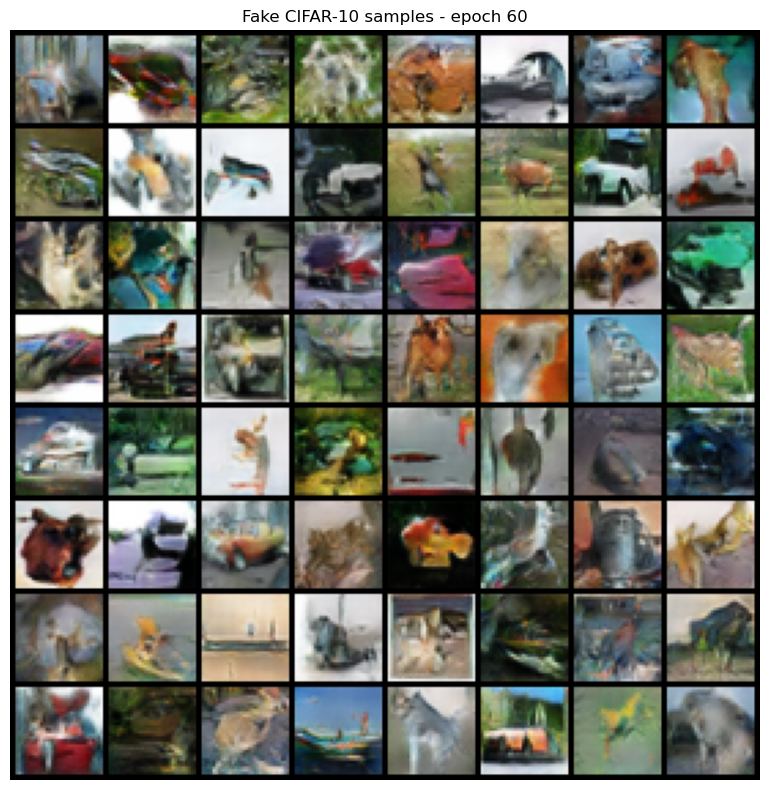

Epoch 61/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [61/100]  avg D loss: 0.9662  avg G loss: 1.6473  avg D(x): 0.6608  avg D(G(z)) before G: 0.3384  avg D(G(z)) after G: 0.2496


Epoch 62/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [62/100]  avg D loss: 0.9190  avg G loss: 1.6178  avg D(x): 0.6655  avg D(G(z)) before G: 0.3333  avg D(G(z)) after G: 0.2484


Epoch 63/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [63/100]  avg D loss: 0.9049  avg G loss: 1.6629  avg D(x): 0.6714  avg D(G(z)) before G: 0.3280  avg D(G(z)) after G: 0.2413


Epoch 64/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [64/100]  avg D loss: 0.9040  avg G loss: 1.6841  avg D(x): 0.6731  avg D(G(z)) before G: 0.3262  avg D(G(z)) after G: 0.2387


Epoch 65/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [65/100]  avg D loss: 0.8969  avg G loss: 1.7048  avg D(x): 0.6751  avg D(G(z)) before G: 0.3244  avg D(G(z)) after G: 0.2360


Epoch 66/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [66/100]  avg D loss: 0.8821  avg G loss: 1.7311  avg D(x): 0.6799  avg D(G(z)) before G: 0.3193  avg D(G(z)) after G: 0.2317


Epoch 67/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [67/100]  avg D loss: 0.8940  avg G loss: 1.7440  avg D(x): 0.6803  avg D(G(z)) before G: 0.3191  avg D(G(z)) after G: 0.2327


Epoch 68/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [68/100]  avg D loss: 0.8791  avg G loss: 1.7608  avg D(x): 0.6830  avg D(G(z)) before G: 0.3159  avg D(G(z)) after G: 0.2283


Epoch 69/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [69/100]  avg D loss: 0.8454  avg G loss: 1.7801  avg D(x): 0.6906  avg D(G(z)) before G: 0.3091  avg D(G(z)) after G: 0.2218


Epoch 70/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [70/100]  avg D loss: 0.8411  avg G loss: 1.8112  avg D(x): 0.6921  avg D(G(z)) before G: 0.3065  avg D(G(z)) after G: 0.2196


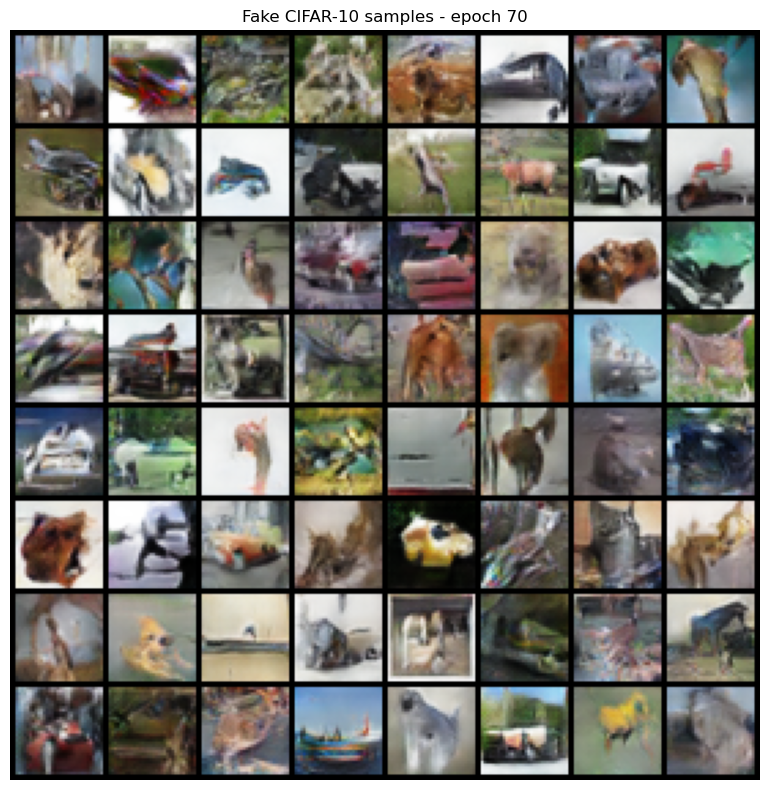

Epoch 71/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [71/100]  avg D loss: 0.8430  avg G loss: 1.8323  avg D(x): 0.6938  avg D(G(z)) before G: 0.3057  avg D(G(z)) after G: 0.2182


Epoch 72/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [72/100]  avg D loss: 0.8840  avg G loss: 1.8614  avg D(x): 0.6929  avg D(G(z)) before G: 0.3066  avg D(G(z)) after G: 0.2211


Epoch 73/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [73/100]  avg D loss: 0.8050  avg G loss: 1.8343  avg D(x): 0.7024  avg D(G(z)) before G: 0.2969  avg D(G(z)) after G: 0.2124


Epoch 74/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [74/100]  avg D loss: 0.8086  avg G loss: 1.8800  avg D(x): 0.7039  avg D(G(z)) before G: 0.2952  avg D(G(z)) after G: 0.2089


Epoch 75/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [75/100]  avg D loss: 0.8242  avg G loss: 1.9027  avg D(x): 0.7038  avg D(G(z)) before G: 0.2958  avg D(G(z)) after G: 0.2102


Epoch 76/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [76/100]  avg D loss: 0.8265  avg G loss: 1.9236  avg D(x): 0.7037  avg D(G(z)) before G: 0.2957  avg D(G(z)) after G: 0.2084


Epoch 77/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [77/100]  avg D loss: 0.8058  avg G loss: 1.9511  avg D(x): 0.7107  avg D(G(z)) before G: 0.2885  avg D(G(z)) after G: 0.2041


Epoch 78/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [78/100]  avg D loss: 0.7723  avg G loss: 1.9270  avg D(x): 0.7144  avg D(G(z)) before G: 0.2846  avg D(G(z)) after G: 0.2002


Epoch 79/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [79/100]  avg D loss: 0.8238  avg G loss: 1.9988  avg D(x): 0.7122  avg D(G(z)) before G: 0.2878  avg D(G(z)) after G: 0.2040


Epoch 80/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [80/100]  avg D loss: 0.7655  avg G loss: 1.9641  avg D(x): 0.7190  avg D(G(z)) before G: 0.2799  avg D(G(z)) after G: 0.1973


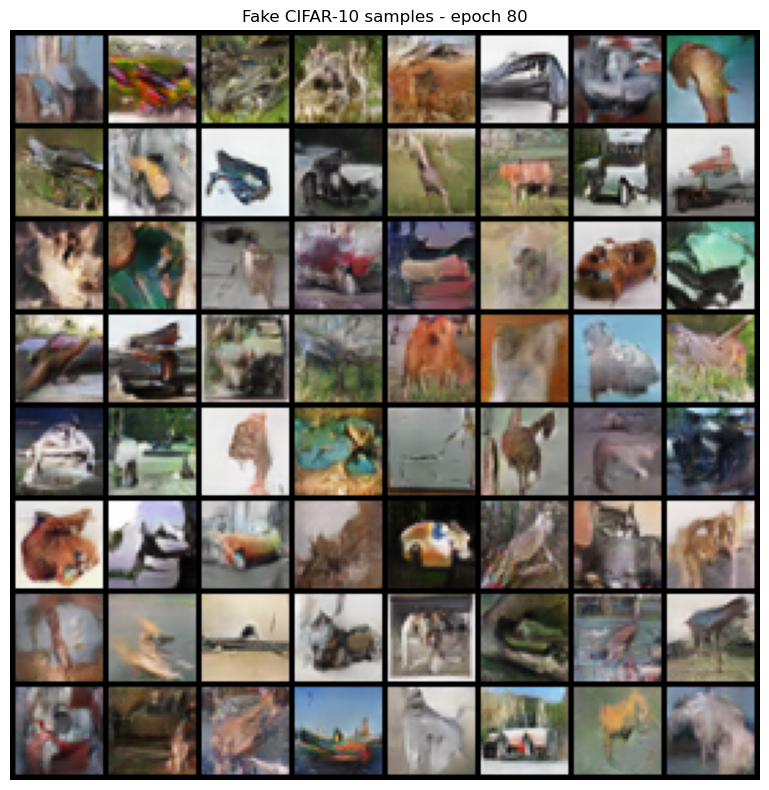

Epoch 81/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [81/100]  avg D loss: 0.7578  avg G loss: 1.9950  avg D(x): 0.7224  avg D(G(z)) before G: 0.2771  avg D(G(z)) after G: 0.1946


Epoch 82/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [82/100]  avg D loss: 0.7415  avg G loss: 2.0388  avg D(x): 0.7258  avg D(G(z)) before G: 0.2733  avg D(G(z)) after G: 0.1883


Epoch 83/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [83/100]  avg D loss: 0.7511  avg G loss: 2.0539  avg D(x): 0.7249  avg D(G(z)) before G: 0.2739  avg D(G(z)) after G: 0.1896


Epoch 84/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [84/100]  avg D loss: 0.7875  avg G loss: 2.1035  avg D(x): 0.7244  avg D(G(z)) before G: 0.2755  avg D(G(z)) after G: 0.1902


Epoch 85/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [85/100]  avg D loss: 0.7386  avg G loss: 2.0903  avg D(x): 0.7328  avg D(G(z)) before G: 0.2665  avg D(G(z)) after G: 0.1837


Epoch 86/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [86/100]  avg D loss: 0.6999  avg G loss: 2.1043  avg D(x): 0.7388  avg D(G(z)) before G: 0.2602  avg D(G(z)) after G: 0.1780


Epoch 87/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [87/100]  avg D loss: 0.7363  avg G loss: 2.1454  avg D(x): 0.7344  avg D(G(z)) before G: 0.2655  avg D(G(z)) after G: 0.1807


Epoch 88/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [88/100]  avg D loss: 0.6953  avg G loss: 2.1659  avg D(x): 0.7420  avg D(G(z)) before G: 0.2568  avg D(G(z)) after G: 0.1731


Epoch 89/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [89/100]  avg D loss: 0.7096  avg G loss: 2.2041  avg D(x): 0.7407  avg D(G(z)) before G: 0.2585  avg D(G(z)) after G: 0.1740


Epoch 90/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [90/100]  avg D loss: 0.6739  avg G loss: 2.2185  avg D(x): 0.7489  avg D(G(z)) before G: 0.2508  avg D(G(z)) after G: 0.1657


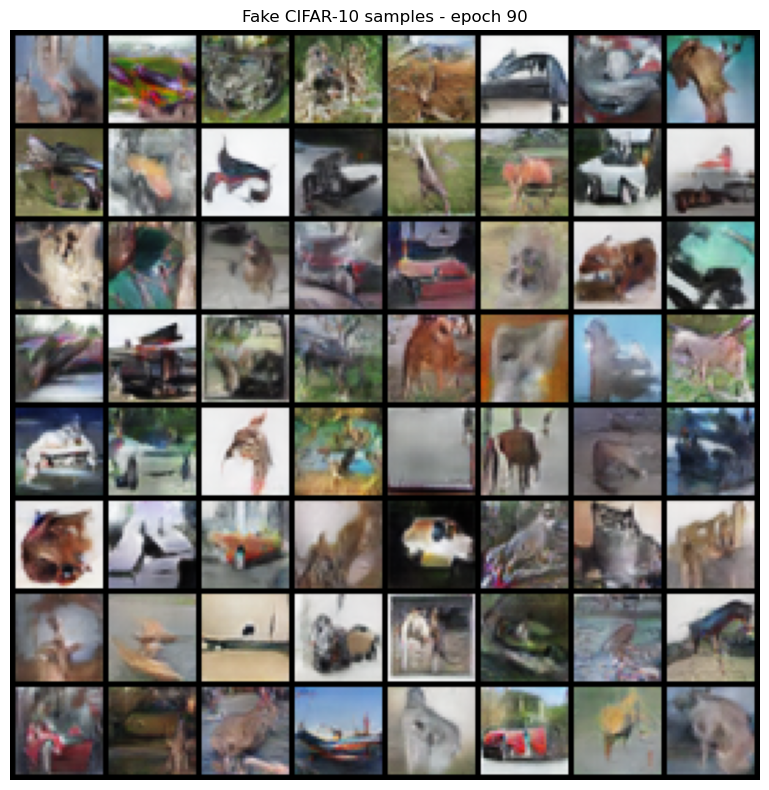

Epoch 91/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [91/100]  avg D loss: 0.7005  avg G loss: 2.2548  avg D(x): 0.7448  avg D(G(z)) before G: 0.2545  avg D(G(z)) after G: 0.1697


Epoch 92/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [92/100]  avg D loss: 0.6783  avg G loss: 2.2595  avg D(x): 0.7504  avg D(G(z)) before G: 0.2491  avg D(G(z)) after G: 0.1659


Epoch 93/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [93/100]  avg D loss: 0.6773  avg G loss: 2.2926  avg D(x): 0.7524  avg D(G(z)) before G: 0.2472  avg D(G(z)) after G: 0.1649


Epoch 94/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [94/100]  avg D loss: 0.6480  avg G loss: 2.3198  avg D(x): 0.7592  avg D(G(z)) before G: 0.2400  avg D(G(z)) after G: 0.1577


Epoch 95/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [95/100]  avg D loss: 0.6566  avg G loss: 2.3411  avg D(x): 0.7583  avg D(G(z)) before G: 0.2412  avg D(G(z)) after G: 0.1585


Epoch 96/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [96/100]  avg D loss: 0.7592  avg G loss: 2.3153  avg D(x): 0.7498  avg D(G(z)) before G: 0.2494  avg D(G(z)) after G: 0.1703


Epoch 97/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [97/100]  avg D loss: 0.6117  avg G loss: 2.3494  avg D(x): 0.7691  avg D(G(z)) before G: 0.2302  avg D(G(z)) after G: 0.1513


Epoch 98/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [98/100]  avg D loss: 0.6427  avg G loss: 2.4064  avg D(x): 0.7651  avg D(G(z)) before G: 0.2346  avg D(G(z)) after G: 0.1546


Epoch 99/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [99/100]  avg D loss: 0.6403  avg G loss: 2.3902  avg D(x): 0.7654  avg D(G(z)) before G: 0.2341  avg D(G(z)) after G: 0.1531


Epoch 100/100:   0%|          | 0/391 [00:00<?, ?it/s]

Epoch [100/100]  avg D loss: 0.6200  avg G loss: 2.4272  avg D(x): 0.7702  avg D(G(z)) before G: 0.2288  avg D(G(z)) after G: 0.1496


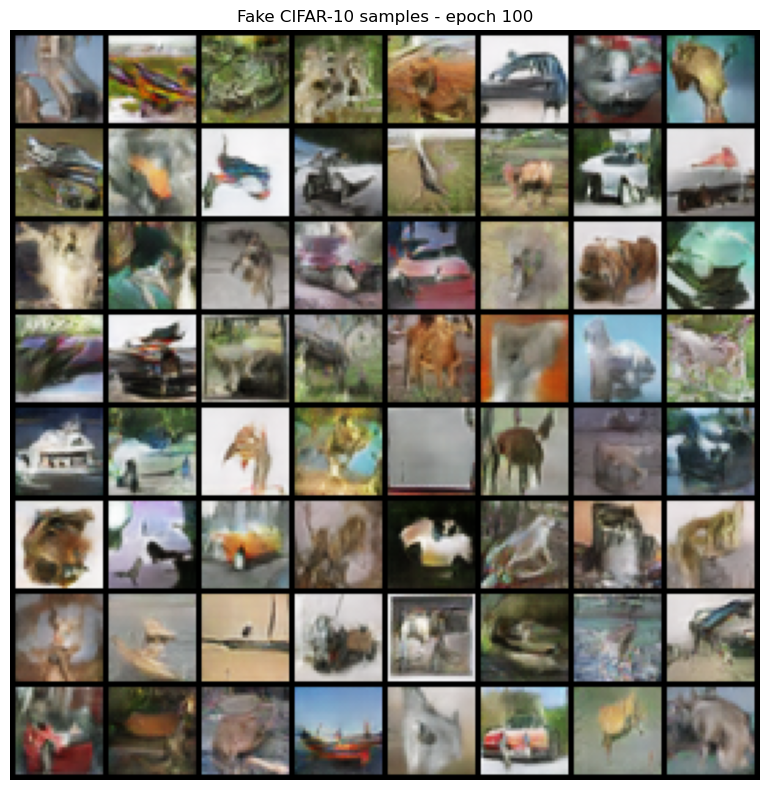

Training finished.
Best epoch: 26
Best avg G loss: 1.1926511594706484
Best generator: C:\Users\aggel\Downloads\outputs\dcgan_cifar10\netG_best.pth
Latest generator: C:\Users\aggel\Downloads\outputs\dcgan_cifar10\netG_latest.pth
Latest discriminator: C:\Users\aggel\Downloads\outputs\dcgan_cifar10\netD_latest.pth
Training history: C:\Users\aggel\Downloads\outputs\dcgan_cifar10\training_history.json


In [10]:
for epoch in range(NUM_EPOCHS):
    netG.train()
    netD.train()

    running_g_loss = 0.0
    running_d_loss = 0.0
    running_D_x = 0.0
    running_D_G_z1 = 0.0
    running_D_G_z2 = 0.0

    progress_bar = tqdm(train_loader, desc=f"Epoch {epoch + 1}/{NUM_EPOCHS}")

    last_real_batch_for_epoch = None

    for real_images, _ in progress_bar:
        real_images = real_images.to(device)
        last_real_batch_for_epoch = real_images.detach().cpu()
        b_size = real_images.size(0)

        # -------------------------
        # 1) Update D
        # -------------------------
        netD.zero_grad(set_to_none=True)

        label_real = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        output_real = netD(real_images)
        errD_real = criterion(output_real, label_real)
        errD_real.backward()
        D_x = output_real.mean().item()

        noise = torch.randn(b_size, NZ, 1, 1, device=device)
        fake_images = netG(noise)

        label_fake = torch.full((b_size,), fake_label, dtype=torch.float, device=device)
        output_fake = netD(fake_images.detach())
        errD_fake = criterion(output_fake, label_fake)
        errD_fake.backward()
        D_G_z1 = output_fake.mean().item()

        errD = errD_real + errD_fake
        optimizerD.step()

        # -------------------------
        # 2) Update G
        # -------------------------
        netG.zero_grad(set_to_none=True)

        label_gen = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        output_for_G = netD(fake_images)
        errG = criterion(output_for_G, label_gen)
        errG.backward()
        D_G_z2 = output_for_G.mean().item()
        optimizerG.step()

        running_d_loss += errD.item()
        running_g_loss += errG.item()
        running_D_x += D_x
        running_D_G_z1 += D_G_z1
        running_D_G_z2 += D_G_z2

        progress_bar.set_postfix({
            "D_loss": f"{errD.item():.4f}",
            "G_loss": f"{errG.item():.4f}",
            "D(x)": f"{D_x:.4f}",
            "D(G(z))": f"{D_G_z2:.4f}",
        })

    avg_d_loss = running_d_loss / len(train_loader)
    avg_g_loss = running_g_loss / len(train_loader)
    avg_D_x = running_D_x / len(train_loader)
    avg_D_G_z1 = running_D_G_z1 / len(train_loader)
    avg_D_G_z2 = running_D_G_z2 / len(train_loader)

    history["d_loss"].append(avg_d_loss)
    history["g_loss"].append(avg_g_loss)
    history["D_x"].append(avg_D_x)
    history["D_G_z1"].append(avg_D_G_z1)
    history["D_G_z2"].append(avg_D_G_z2)

    print(
        f"Epoch [{epoch + 1}/{NUM_EPOCHS}]  "
        f"avg D loss: {avg_d_loss:.4f}  avg G loss: {avg_g_loss:.4f}  "
        f"avg D(x): {avg_D_x:.4f}  avg D(G(z)) before G: {avg_D_G_z1:.4f}  avg D(G(z)) after G: {avg_D_G_z2:.4f}"
    )

    # Always save latest checkpoints
    torch.save(netG.state_dict(), LATEST_NETG_PATH)
    torch.save(netD.state_dict(), LATEST_NETD_PATH)

    # Save best generator
    if avg_g_loss < best_g_loss:
        best_g_loss = avg_g_loss
        best_epoch = epoch + 1
        torch.save(netG.state_dict(), BEST_NETG_PATH)
        print(f"Saved new best generator to: {BEST_NETG_PATH}")

    # Save sample grids during training
    if epoch == 0 or (epoch + 1) % SAVE_SAMPLE_EVERY == 0 or (epoch + 1) == NUM_EPOCHS:
        save_path = SAMPLES_DIR / f"epoch_{epoch + 1:03d}.png"
        save_fake_grid(netG, fixed_noise, save_path, title=f"Fake CIFAR-10 samples - epoch {epoch + 1}")

# Save training history
with open(HISTORY_PATH, "w", encoding="utf-8") as f:
    json.dump(history, f, indent=2)

print("Training finished.")
print("Best epoch:", best_epoch)
print("Best avg G loss:", best_g_loss)
print("Best generator:", BEST_NETG_PATH)
print("Latest generator:", LATEST_NETG_PATH)
print("Latest discriminator:", LATEST_NETD_PATH)
print("Training history:", HISTORY_PATH)

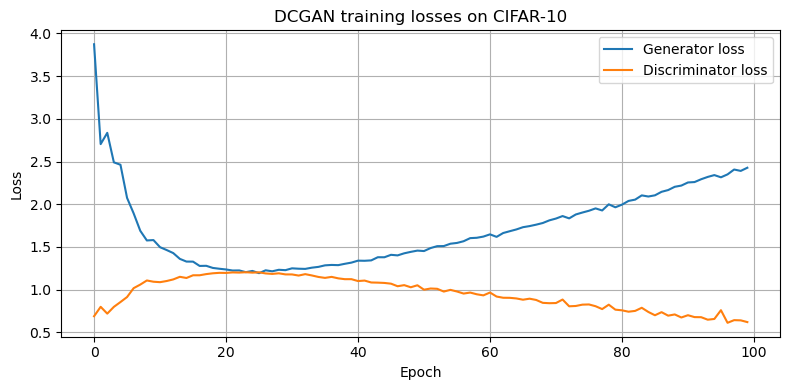

Saved loss plot to: C:\Users\aggel\Downloads\outputs\dcgan_cifar10\loss_curves.png


In [11]:
# Save and show loss curves
plt.figure(figsize=(8, 4))
plt.plot(history["g_loss"], label="Generator loss")
plt.plot(history["d_loss"], label="Discriminator loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("DCGAN training losses on CIFAR-10")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig(LOSS_PLOT_PATH, bbox_inches="tight")
plt.show()

print("Saved loss plot to:", LOSS_PLOT_PATH)

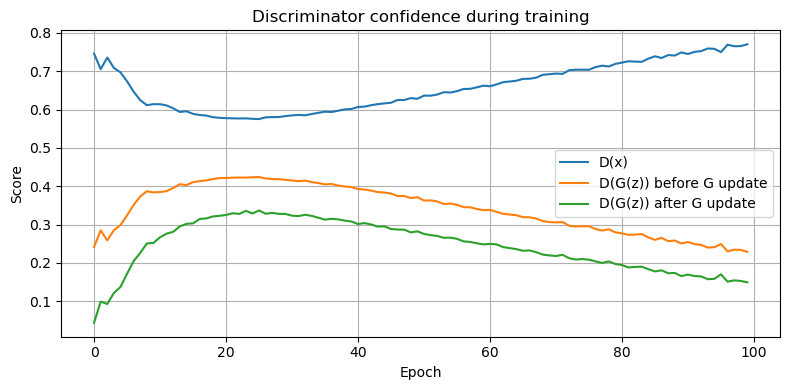

Saved discriminator score plot to: C:\Users\aggel\Downloads\outputs\dcgan_cifar10\discriminator_scores.png


In [12]:
# Save and show discriminator score curves
plt.figure(figsize=(8, 4))
plt.plot(history["D_x"], label="D(x)")
plt.plot(history["D_G_z1"], label="D(G(z)) before G update")
plt.plot(history["D_G_z2"], label="D(G(z)) after G update")
plt.xlabel("Epoch")
plt.ylabel("Score")
plt.title("Discriminator confidence during training")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig(DISC_SCORE_PLOT_PATH, bbox_inches="tight")
plt.show()

print("Saved discriminator score plot to:", DISC_SCORE_PLOT_PATH)

## Load the best generator

In [13]:
best_netG = DCGANGenerator(
    nc=NC,
    nz=NZ,
    ngf=NGF,
    image_size=IMAGE_SIZE,
).to(device)

best_netG.load_state_dict(torch.load(BEST_NETG_PATH, map_location=device))
best_netG.eval()

print("Loaded best generator from:", BEST_NETG_PATH)

Loaded best generator from: C:\Users\aggel\Downloads\outputs\dcgan_cifar10\netG_best.pth


C:\Users\aggel\AppData\Local\Temp\ipykernel_26540\2459911916.py:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  best_netG.load_state_dict(torch.load(BEST_NETG_PATH, map_loc

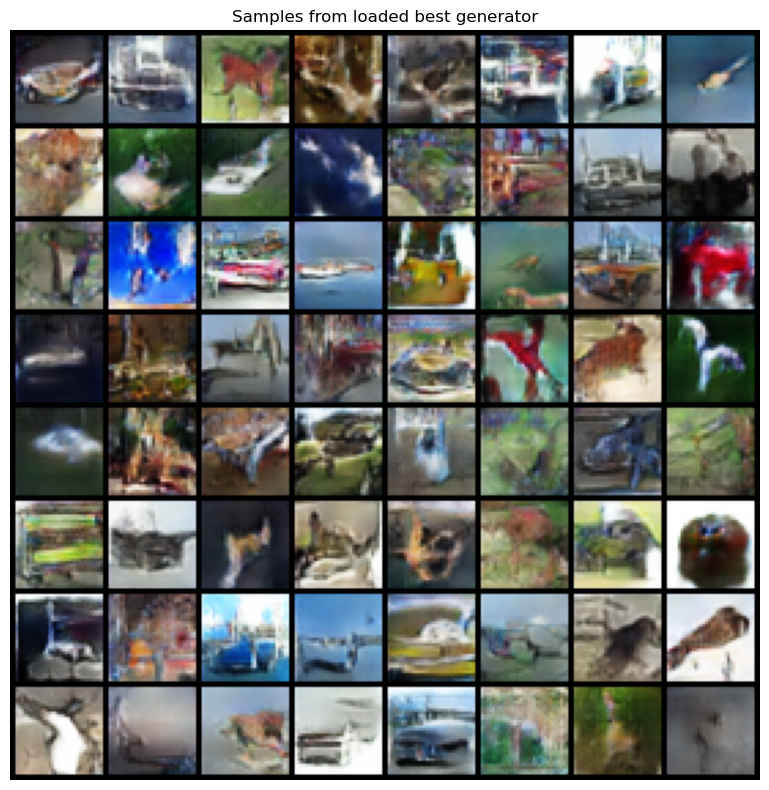

Saved final best-generator samples to: C:\Users\aggel\Downloads\outputs\dcgan_cifar10\final_loaded_best_samples.png


In [14]:
# Generate samples from the loaded best generator and save them
with torch.no_grad():
    noise = torch.randn(64, NZ, 1, 1, device=device)
    fake = best_netG(noise).cpu()

grid = utils.make_grid((fake + 1) / 2, nrow=8, padding=2)

plt.figure(figsize=(8, 8))
plt.axis("off")
plt.title("Samples from loaded best generator")
plt.imshow(grid.permute(1, 2, 0).numpy())
plt.tight_layout()
plt.savefig(FINAL_BEST_SAMPLES_PATH, bbox_inches="tight")
plt.show()

print("Saved final best-generator samples to:", FINAL_BEST_SAMPLES_PATH)

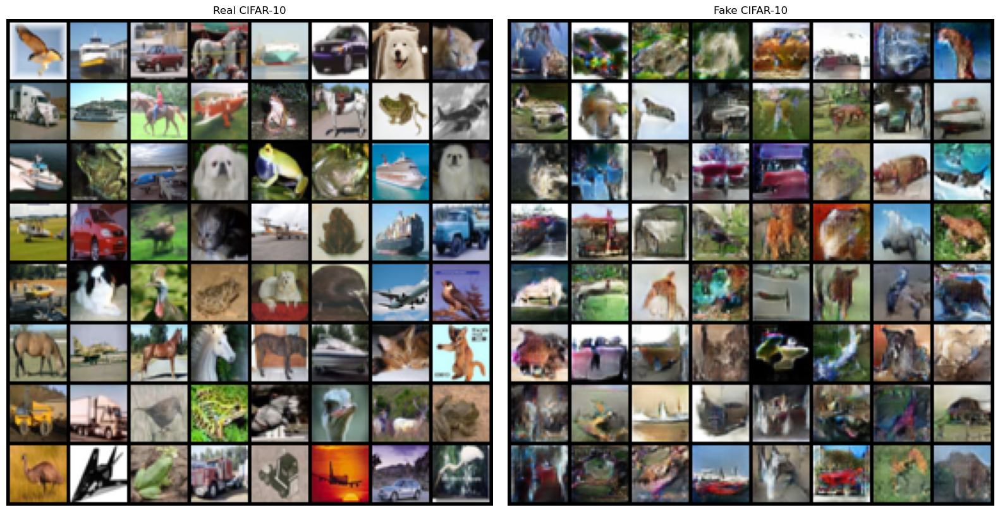

Saved real-vs-fake comparison to: C:\Users\aggel\Downloads\outputs\dcgan_cifar10\real_vs_fake_comparison.png


In [15]:
# Save a real-vs-fake comparison figure
real_batch_for_comparison, _ = next(iter(train_loader))
save_real_vs_fake_comparison(
    real_batch_for_comparison,
    best_netG,
    fixed_noise,
    REAL_FAKE_COMPARISON_PATH,
)

print("Saved real-vs-fake comparison to:", REAL_FAKE_COMPARISON_PATH)

## test command

After training, you can use the saved checkpoint like this:

```bash
py Scripts/test_dcgan.py --netG outputs/dcgan_cifar10/netG_best.pth --out-dir outputs/dcgan_test --num-samples 64 --image-size 32 --channels 3
```
